# bibles

In [1]:
import networkx as nx
import operator
import itertools
from nltk import sent_tokenize
import matplotlib.pyplot as plt
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'\w+')
import numpy as np
import xml.etree.ElementTree as ET
import pickle
import community
import networkit as nkit

In [2]:
def extract_bible_text(lang):
    root = ET.fromstring(open(lang + '.xml').read())
    with open(lang + '.txt', 'w', encoding='utf-8') as out:
        for n in root.iter('seg'):
            try:
                out.write(n.text.strip() + '\n')
            except AttributeError:
                pass
    file = open(lang+'.txt', 'r') 
    bible=file.read().split('\n')
    #bible=[item for sublist in bible for item in sublist]
    return bible

## languages

In [3]:
language_names = ['Latin','Spanish','French','Italian','Portuguese','Romanian']
languages = {}
for language in language_names:
    languages[language]=extract_bible_text(language)#' '.join(extract_bible_text(language))

In [4]:
languages['Latin']

['in principio creavit Deus caelum et terram',
 'terra autem erat inanis et vacua et tenebrae super faciem abyssi et spiritus Dei ferebatur super aquas',
 'dixitque Deus fiat lux et facta est lux',
 'et vidit Deus lucem quod esset bona et divisit lucem ac tenebras',
 'appellavitque lucem diem et tenebras noctem factumque est vespere et mane dies unus',
 'dixit quoque Deus fiat firmamentum in medio aquarum et dividat aquas ab aquis',
 'et fecit Deus firmamentum divisitque aquas quae erant sub firmamento ab his quae erant super firmamentum et factum est ita',
 'vocavitque Deus firmamentum caelum et factum est vespere et mane dies secundus',
 'dixit vero Deus congregentur aquae quae sub caelo sunt in locum unum et appareat arida factumque est ita',
 'et vocavit Deus aridam terram congregationesque aquarum appellavit maria et vidit Deus quod esset bonum',
 'et ait germinet terra herbam virentem et facientem semen et lignum pomiferum faciens fructum iuxta genus suum cuius semen in semet ips

## tokenization

In [5]:
def clean(language):
    language=[[w.lower() for w in tokenizer.tokenize(sentence)] for sentence in language if len([w.lower() for w in tokenizer.tokenize(sentence)])>0]
    return language

In [6]:
for language in language_names:
    languages[language]=clean(languages[language])

In [7]:
for language in languages:
    print(language,len(languages[language]),len([item for sublist in languages[language] for item in sublist]),len(set([item for sublist in languages[language] for item in sublist])))

Latin 31211 534301 42089
Spanish 31100 718543 26308
French 31102 782838 20532
Italian 31280 679747 29984
Portuguese 31092 707005 26111
Romanian 31102 720900 20345


## graphs

In [139]:
def GoW(text_clean,K=None):
    if K==None:
        K=4
    unique_words=list(set([item for sublist in text_clean for item in sublist]))
    G=nx.Graph()
    for sentence in text_clean:
        for word in set(sentence): ## recorremos el texto y encontramos los índices de todas las aparicions de word (index_word)
            index_word=[index for index, value in enumerate(sentence) if value == word]
            ## ahora buscamos las palabras vecinas en una ventana de largo K (hacia adelante!)
            for index in index_word:
                for k in range(1,K+1):
                    if index+k in range(len(sentence)):
                        if G.has_edge(sentence[index],sentence[index+k])==False:
                            G.add_edge(sentence[index],sentence[index+k])#,weight=1)
                
    
    return G

In [172]:
def GoW(text_clean):
    G=nx.Graph()
    for sentence in text_clean:
        unique_words=list(set(sentence))
        pairs=list(itertools.combinations(unique_words,2)) ## sin repeticion!
        for pair in pairs:
            if G.has_edge(pair[0],pair[1])==False:
                G.add_edge(pair[0],pair[1])#,weight=1)
            #else:
            #    x=G[pair[0]][pair[1]]['weight']
            #    G[pair[0]][pair[1]]['weight']=x+1
        
    return G

In [173]:
graphs={}
for language in language_names:
    print(language)
    G=GoW(languages[language])
    graphs[language]=G

Latin
Spanish
French
Italian
Portuguese
Romanian


In [174]:
pickle.dump(graphs,open('bible_graphs.p','wb'))

In [175]:
graphs=pickle.load(open('bible_graphs.p','rb'))

In [176]:
density_clustering={}
shell_clustering={}
for language in language_names:
    G=graphs[language]
    G.remove_edges_from(nx.selfloop_edges(G))
    print(language)
    nodes=len(G.nodes)
    print('nodes: '+str(nodes))
    
    edges=len(G.edges)
    print('edges: '+str(edges))
    
    density=nx.density(G)
    print('density: '+str(density))
    
    average_degree=np.mean(list(dict(nx.degree(G)).values()))
    print('average_degree: '+str(average_degree))
    
    max_degree=np.max(list(dict(nx.degree(G)).values()))
    print('max_degree: '+str(max_degree))
    
    assortativity=nx.degree_pearson_correlation_coefficient(G)
    print('assortativity: '+str(assortativity))
    
    nkit_G=nkit.nxadapter.nx2nk(G)
    
    clustering=np.mean(nkit.centrality.LocalClusteringCoefficient(nkit_G).run().scores())
    print('average_clustering: '+str(clustering))
    
    #v = 0
    #bfs = nkit.distance.BFS(nkit_G, v)
    #bfs.run()
    #bfsdist = bfs.getDistances()
    #shortest=np.mean(bfsdist)

    #print('average_shortest_path: '+str(shortest))
    cc = nkit.components.ConnectedComponents(nkit_G)
    cc.run()
    number_cc=cc.numberOfComponents()
    print('number_connected_components: '+str(number_cc))
    
    core_number=np.mean(nkit.centrality.CoreDecomposition(nkit_G).run().scores())
    print('average_core_number: '+str(core_number))
    
    max_core_number=np.max(nkit.centrality.CoreDecomposition(nkit_G).run().scores())
    print('max_core_number: '+str(max_core_number))
    
    shell_clustering[language]=[nkit.centrality.CoreDecomposition(nkit_G).run().scores(),nkit.centrality.LocalClusteringCoefficient(nkit_G).run().scores()]
    
    density_clustering[language]=[max_core_number,nodes,edges,density,clustering,number_cc,max_degree,average_degree,core_number,assortativity]

Latin
nodes: 42089
edges: 1957307
density: 0.0022098461994545467
average_degree: 93.00800684264297
max_degree: 37058
assortativity: -0.1584983097672483
average_clustering: 0.7943336721566275
number_connected_components: 1
average_core_number: 47.922901470693056
max_core_number: 292.0
Spanish
nodes: 26308
edges: 1654981
density: 0.004782597691719044
average_degree: 125.81579747605291
max_degree: 22340
assortativity: -0.2465594833108812
average_clustering: 0.8320125114007064
number_connected_components: 5
average_core_number: 65.21031625361107
max_core_number: 320.0
French
nodes: 20532
edges: 1658153
density: 0.007867074050508769
average_degree: 161.51889733099551
max_degree: 17901
assortativity: -0.29782280449990967
average_clustering: 0.8236730654215103
number_connected_components: 6
average_core_number: 83.9473017728424
max_core_number: 339.0
Italian
nodes: 29984
edges: 1916991
density: 0.004264669847954752
average_degree: 127.86759605122732
max_degree: 24123
assortativity: -0.2622001

In [177]:
shell_clustering_zip={language:[] for language in language_names}
for language in language_names:
    shell_clustering_zip[language]={x:np.mean([shell_clustering[language][1][i] for i in range(len(shell_clustering[language][1])) if shell_clustering[language][0][i]==x]) for x in list(set(shell_clustering[language][0]))}

In [178]:
shell_clustering_zip

{'Latin': {2.0: 1.0,
  3.0: 0.9868589743589743,
  4.0: 0.9782988004362051,
  5.0: 0.9972044539208718,
  6.0: 0.9855247571665483,
  7.0: 0.9917600121606057,
  8.0: 0.9933870642061768,
  9.0: 0.9930458741964822,
  10.0: 0.9960040486463252,
  11.0: 0.9899604249464585,
  12.0: 0.9890264313767464,
  13.0: 0.9869228116708476,
  14.0: 0.9802352728072815,
  15.0: 0.9744141557675595,
  16.0: 0.9731818700231885,
  17.0: 0.9652729243724234,
  18.0: 0.9688310758077286,
  19.0: 0.9582035284714144,
  20.0: 0.942386172832356,
  21.0: 0.9416617898367902,
  22.0: 0.9279048641875263,
  23.0: 0.9202960844298308,
  24.0: 0.8971884535001399,
  25.0: 0.8966008341467928,
  26.0: 0.8796626945251316,
  27.0: 0.8607864593659282,
  28.0: 0.8464638893144886,
  29.0: 0.8537704160551145,
  30.0: 0.8264896237257934,
  31.0: 0.8193816602826579,
  32.0: 0.7913359110434671,
  33.0: 0.7967803750533823,
  34.0: 0.7890500131160127,
  35.0: 0.7747030010411888,
  36.0: 0.7372148367330829,
  37.0: 0.7283048340405429,
  38.0:

In [179]:
pickle.dump(density_clustering,open('graphs_measures.p','wb'))

In [180]:
density_clustering=pickle.load(open('graphs_measures.p','rb'))

In [181]:
density_clustering

{'Latin': [292.0,
  42089,
  1957307,
  0.0022098461994545467,
  0.7943336721566275,
  1,
  37058,
  93.00800684264297,
  47.922901470693056,
  -0.1584983097672483],
 'Spanish': [320.0,
  26308,
  1654981,
  0.004782597691719044,
  0.8320125114007064,
  5,
  22340,
  125.81579747605291,
  65.21031625361107,
  -0.2465594833108812],
 'French': [339.0,
  20532,
  1658153,
  0.007867074050508769,
  0.8236730654215103,
  6,
  17901,
  161.51889733099551,
  83.9473017728424,
  -0.29782280449990967],
 'Italian': [348.0,
  29984,
  1916991,
  0.004264669847954752,
  0.8372397461615774,
  7,
  24123,
  127.86759605122732,
  66.31583511205976,
  -0.2622001077839194],
 'Portuguese': [340.0,
  26111,
  1715795,
  0.005033441401461084,
  0.8322994712177679,
  4,
  22668,
  131.4231549921489,
  68.2726054153422,
  -0.25173997160984257],
 'Romanian': [378.0,
  20345,
  1722048,
  0.008321108924531966,
  0.8031481229133491,
  6,
  18189,
  169.2846399606783,
  88.69810764315557,
  -0.2708958839927999]

In [182]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X=[]
for language in language_names:
    X+=[density_clustering[language]]
X = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
X = pca.fit(X).transform(X)
#import scipy
#scipy.spatial.distance.cdist(X,X,metric='cosine')

#pca = PCA(n_components=2)
#X = pca.fit(scipy.spatial.distance.cdist(X,X,metric='cosine')).transform(scipy.spatial.distance.cdist(X,X,metric='cosine'))

In [183]:
from sklearn.metrics.pairwise import cosine_similarity
import operator
distances={language_names[i]:cosine_similarity(X[0].reshape(1, -1),X[i].reshape(1, -1)) for i in range(len(language_names))}

In [184]:
sorted(distances.items(), key=operator.itemgetter(1),reverse=True)

[('Latin', array([[1.]])),
 ('Italian', array([[-0.11247722]])),
 ('Spanish', array([[-0.15161996]])),
 ('Portuguese', array([[-0.40712602]])),
 ('Romanian', array([[-0.74081825]])),
 ('French', array([[-0.9658908]]))]

In [185]:
X

array([[ 5.5683863 ,  1.03911189],
       [ 0.03133933, -0.9705143 ],
       [-2.67086825,  0.20726655],
       [ 0.10425762, -1.45013777],
       [-0.14466207, -0.60469532],
       [-2.88845293,  1.77896895]])

In [186]:
x=list(zip(*list(X)))[0]
y=list(zip(*list(X)))[1]

In [187]:
from sklearn import cluster
k_means = cluster.KMeans(n_clusters=2, n_init=1)
k_means.fit(X) 
k_means.labels_

array([1, 0, 0, 0, 0, 0], dtype=int32)

In [188]:
k_means.cluster_centers_

array([[-1.11367726, -0.20782238],
       [ 5.5683863 ,  1.03911189]])

In [189]:
center_x=list(zip(*k_means.cluster_centers_))[0]
center_y=list(zip(*k_means.cluster_centers_))[1]

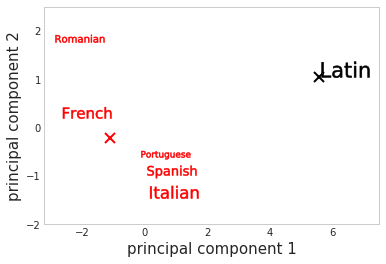

In [190]:
from matplotlib.text import TextPath
colors=['r','k']
cmap = plt.get_cmap('RdBu')
for i in range(len(x)):
    path = TextPath((0,0), language_names[i],linewidth=1)

    # These dots are to display the weakness below, remove for the actual question
    #plt.plot(x[i],y[i],'x',color=colors[k_means.labels_[i]],markersize=10,markeredgewidth=1.5,fillstyle='none',clip_on=True)
    plt.plot(x[i],y[i],marker=path,markersize=100, color=colors[k_means.labels_[i]],markeredgewidth=0.5,clip_on=True)

for i in range(len(colors)):
    plt.plot(center_x[i],center_y[i],'x',color=colors[i],markersize=10,markeredgewidth=2,fillstyle='none',clip_on=True)

plt.grid(False)
plt.xlim([-3.2,7.5])
plt.ylim([-2,2.5])
plt.ylabel(r'principal component 2',fontsize=15)
plt.xlabel(r'principal component 1',fontsize=15)
plt.rcParams.update({'font.size': 15})
plt.savefig('PCA.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [191]:
degree_sequence={}
for language in language_names:
    G=graphs[language]
    nkit_G=nkit.nxadapter.nx2nk(G)
    dd=sorted(nkit.centrality.CoreDecomposition(nkit_G).run().scores(), reverse=True)
    degree_sequence[language]=dd

In [192]:
colors={'Latin':['r','*'],'Spanish':['k','+'],'French':['m','s'],'Italian':['b','o'],'Portuguese':['orange','>'],'Romanian':['cyan','<']}

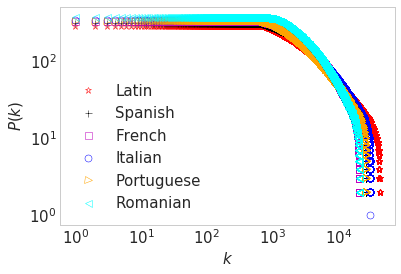

In [193]:
for language in language_names:
    degree=degree_sequence[language]
    plt.loglog(range(len(degree)), degree, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0,label=language)

plt.grid(False)
plt.legend(loc='best')
plt.ylabel('$P(k)$',fontsize=15)
plt.xlabel('$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('degree_sequence.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

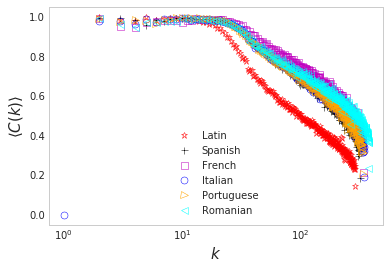

In [194]:
for language in language_names:
    X=list(shell_clustering_zip[language].keys())
    Y=list(shell_clustering_zip[language].values())
    plt.semilogx(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.,label=language)

plt.grid(False)
plt.legend(loc='best')
plt.ylabel(r'$\langle C(k) \rangle$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('clustering_k.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [163]:
graphs=pickle.load(open('bible_graphs.p','rb'))

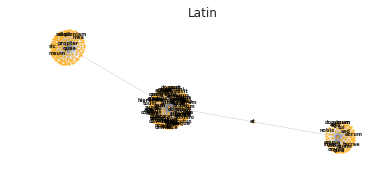

KeyboardInterrupt: 

In [128]:
## primera versión
for language in language_names:
    G=graphs[language]
    G.remove_edges_from(nx.selfloop_edges(G))
    G=nx.k_core(G)
    #core=nx.core_number(G)
    ######################################################################
    core=nx.pagerank(G)
    #PR_promedio = np.mean(list(PR_nodes.values()))
    #PR_sobre_promedio={k:v for k, v in PR_nodes.items() if v>=PR_promedio} ## nodos para formar el subgrafo
    #PR_sobre_promedio_ordered = list(zip(*sorted(PR_sobre_promedio.items(), key=operator.itemgetter(1),reverse=True)))[0]
    #######################################################################
    #G=G.subgraph(PR_sobre_promedio_ordered) ## subgrafo formado por los nodos con pagerank >= promedio
    #G=G.subgraph(max(nx.connected_components(G), key=len)) ## componente gigante del subgrafo! (eventualmente, los grafos son disconexos)
    G=nx.minimum_spanning_tree(G) ## aplicamos un árbol de cobertura máxima
    #G=remove_edges(G)
    #print('reduced size :'+str(len(G)))
    #BC_nodes=nx.pagerank(G,weight='weight')
    #node_sizes=list(BC_nodes.values())
    coord = nx.spring_layout(G,iterations=1000)
    labels_cent={i:i for i in G.nodes if core[i]>1.2*np.mean(list(core.values()))}
    #G=nx.minimum_spanning_tree(G)
    fig = plt.figure()
    axs = fig.add_subplot(111,aspect='equal')
    axs.axis('off')
    plt.title(language)
    nx.draw_networkx_edges(G, coord,alpha=0.75,width=0.25,edge_color='gray')
    nx.draw_networkx_nodes(G, coord,alpha=0.85,node_size= 4,node_color='orange',linewidths=0.25)
    nx.draw_networkx_labels(G, coord,labels_cent,alpha=0.85,font_size=5, font_weight='bold',font_color='k')

    plt.savefig('grafo_'+language+'.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=1000)
    plt.show()

In [195]:
k_decomposition={}
for language in language_names:
    print(language)
    G=graphs[language]
    G.remove_edges_from(nx.selfloop_edges(G))
    core_numbers=nx.core_number(G)
    k_decomposition[language]=core_numbers

Latin
Spanish
French
Italian
Portuguese
Romanian


In [196]:
pickle.dump(k_decomposition,open('k_decomposition.p','wb'))

In [197]:
k_decomposition=pickle.load(open('k_decomposition.p','rb'))

In [198]:
from collections import Counter
frequency={}
for language in language_names:
    D=dict(Counter([item for sublist in languages[language] for item in sublist]))
    frequency[language]={x:[D[x],k_decomposition[language][x]] for x in D.keys()}# if x in k_decomposition[language].keys()}

In [199]:
frequency['Latin']

{'in': [19511, 292],
 'principio': [44, 249],
 'creavit': [23, 164],
 'deus': [1917, 292],
 'caelum': [155, 292],
 'et': [43488, 292],
 'terram': [1018, 292],
 'terra': [1151, 292],
 'autem': [4527, 292],
 'erat': [1063, 292],
 'inanis': [10, 83],
 'vacua': [8, 84],
 'tenebrae': [40, 183],
 'super': [2898, 292],
 'faciem': [362, 292],
 'abyssi': [17, 102],
 'spiritus': [324, 292],
 'dei': [1263, 292],
 'ferebatur': [3, 31],
 'aquas': [119, 292],
 'dixitque': [408, 292],
 'fiat': [80, 290],
 'lux': [57, 216],
 'facta': [200, 292],
 'est': [7550, 292],
 'vidit': [166, 292],
 'lucem': [47, 216],
 'quod': [2547, 292],
 'esset': [399, 292],
 'bona': [118, 292],
 'divisit': [23, 192],
 'ac': [397, 292],
 'tenebras': [33, 163],
 'appellavitque': [8, 86],
 'diem': [275, 292],
 'noctem': [43, 229],
 'factumque': [11, 104],
 'vespere': [48, 254],
 'mane': [199, 292],
 'dies': [508, 292],
 'unus': [264, 292],
 'dixit': [1266, 292],
 'quoque': [755, 292],
 'firmamentum': [16, 116],
 'medio': [457,

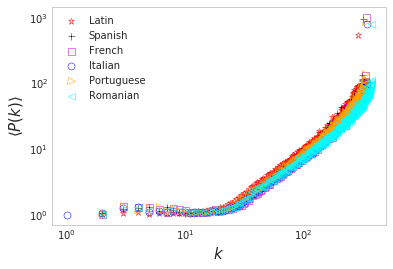

In [200]:
for language in language_names:
    Y=list(zip(*list(frequency[language].values())))[0]
    X=list(zip(*list(frequency[language].values())))[1]
    
    X_reduced={x:[] for x in list(set(X))}
    for i in range(len(Y)):
        X_reduced[X[i]]+=[Y[i]]
    for x in X_reduced.keys():
        X_reduced[x]=np.mean(X_reduced[x])
    
    Y=list(X_reduced.values())
    X=list(X_reduced.keys())
    plt.loglog(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.,label=language)

plt.grid(False)
plt.legend(loc='best')
plt.ylabel(r'$\langle P(k) \rangle$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('frequency.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [201]:
k_decomposition_size={}
for language in language_names:
    print(language)
    G=graphs[language]
    nkit_G=nkit.nxadapter.nx2nk(G)
    nkit_G.removeSelfLoops()
    coreDec = nkit.centrality.CoreDecomposition(nkit_G)
    coreDec.run()
    
    k_decomposition_size[language]=coreDec.getPartition().subsetSizeMap()

Latin
Spanish
French
Italian
Portuguese
Romanian


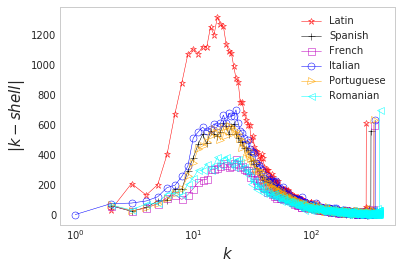

In [202]:
for language in language_names:
    X=list(k_decomposition_size[language].keys())
    Y=list(k_decomposition_size[language].values())
    plt.semilogx(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.5,label=language)

plt.grid(False)
plt.legend(loc='best')
plt.ylabel(r'$|k-shell|$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('k_shell_zoom.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [111]:
clustering={}
for language in language_names:
    print(language)
    clustering[language]=nx.pagerank(graphs[language])

Latin
Spanish
French
Italian
Portuguese
Romanian


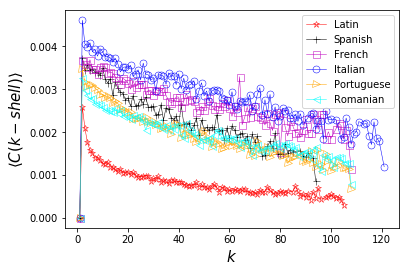

In [68]:
for language in language_names:
    X=list(k_decomposition[language].keys())
    Y=[np.mean([clustering[language][node] for node in k_decomposition[language][k].nodes()]) for k in k_decomposition[language].keys()]
    plt.plot(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.5,label=language)

plt.legend(loc='best')
plt.ylabel(r'$\langle C(k-shell) \rangle$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('clustering.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

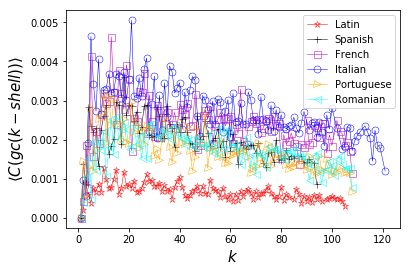

In [69]:
for language in language_names:
    X=list(k_decomposition[language].keys())
    Y=[np.mean([page_rank[language][node] for node in graphs[language].subgraph(max(nx.connected_components(k_decomposition[language][k]), key=len))
.nodes()]) for k in k_decomposition[language].keys()]
    plt.plot(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.5,label=language)

plt.legend(loc='best')
plt.ylabel(r'$\langle C(gc(k-shell)) \rangle$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('clustering_gc.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [70]:
page_rank_un={}
for language in language_names:
    print(language)
    page_rank_un[language]=nx.clustering(graphs[language],weight=None)

Latin
Spanish
French
Italian
Portuguese
Romanian


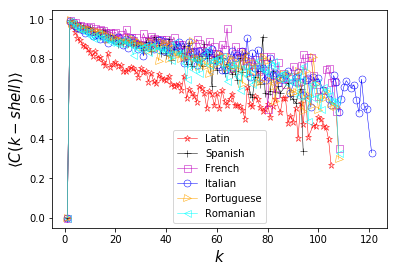

In [71]:
for language in language_names:
    X=list(k_decomposition[language].keys())
    Y=[np.mean([page_rank_un[language][node] for node in k_decomposition[language][k].nodes()]) for k in k_decomposition[language].keys()]
    plt.plot(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.5,label=language)

plt.legend(loc='best')
plt.ylabel(r'$\langle C(k-shell) \rangle$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('unweighted_clustering.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

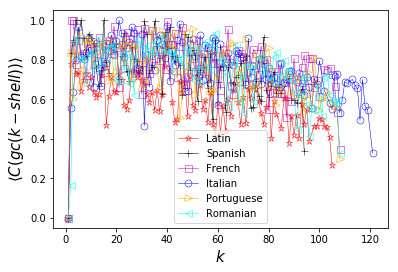

In [72]:
for language in language_names:
    X=list(k_decomposition[language].keys())
    Y=[np.mean([page_rank_un[language][node] for node in graphs[language].subgraph(max(nx.connected_components(k_decomposition[language][k]), key=len))
.nodes()]) for k in k_decomposition[language].keys()]
    plt.plot(X,Y, colors[language][0],marker=colors[language][1],markersize=7,fillstyle='none',markeredgewidth=0.5,clip_on=True,linewidth=0.5,label=language)

plt.legend(loc='best')
plt.ylabel(r'$\langle C(gc(k-shell)) \rangle$',fontsize=15)
plt.xlabel(r'$k$',fontsize=15)
plt.rcParams.update({'font.size': 10})
plt.savefig('unweighted_clustering_gc.jpg', format='jpg', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [67]:
graph_quechua=graph(new_testament_quechua)

In [94]:
degree_sequence_english=sorted(dict(nx.degree(graph_english,weight='weight')).values(),reverse=True)

In [95]:
degree_sequence_spanish=sorted(dict(nx.degree(graph_spanish,weight='weight')).values(),reverse=True)

In [96]:
degree_sequence_quechua=sorted(dict(nx.degree(graph_quechua,weight='weight')).values(),reverse=True)

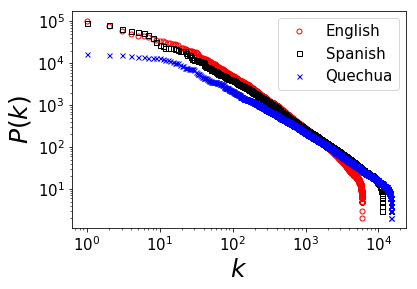

In [97]:
plt.loglog(range(len(degree_sequence_english)), degree_sequence_english, 'r',marker='o',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=True,linewidth=0,label='English')
plt.loglog(range(len(degree_sequence_spanish)), degree_sequence_spanish, 'k',marker='s',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=True,linewidth=0,label='Spanish')
plt.loglog(range(len(degree_sequence_quechua)), degree_sequence_quechua, 'b',marker='x',markersize=5,fillstyle='none',markeredgewidth=1,clip_on=True,linewidth=0,label='Quechua')

plt.legend(loc='best')
plt.ylabel('$P(k)$',fontsize=25)
plt.xlabel('$k$',fontsize=25)
plt.rcParams.update({'font.size': 15})
plt.savefig('degree_sequence.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [105]:
import community

def GoW_features(G):
    
    features={}
    features['number_nodes']=len(G.nodes)
    #features['number_edges']=len(G.edges)
    #features['average_degree']=np.mean(list(dict(nx.degree(G,weight='weight')).values()))
    #features['average_neighbor_degree']=np.mean(list(dict(nx.average_neighbor_degree(G,weight='weight')).values()))
    #features['average_clustering']=nx.average_clustering(G,weight='weight')
    #features['average_shortest_path_length']=nx.average_shortest_path_length(G,weight='weight')
    #features['betweenness_centrality']=np.mean(list(dict(nx.betweenness_centrality(G,weight='weight')).values())) 
    partition = community.best_partition(G)
    features['number_communities']=float(len(set(partition.values())))
    features['partition']=community.modularity(partition,G)
    features['pearson']=nx.degree_pearson_correlation_coefficient(G,weight='weight')
    G.remove_edges_from(nx.selfloop_edges(G))
    features['average_core_number']=np.mean(list(dict(nx.core_number(G)).values()))
    features['main_core']=len(nx.k_core(G))
    #features['main_crust']=len(nx.k_crust(G))

    return features

In [106]:
features_english=GoW_features(graph_english)

In [107]:
features_spanish=GoW_features(graph_spanish)

In [108]:
features_quechua=GoW_features(graph_quechua)

In [109]:
print(features_english,features_spanish,features_quechua)

{'number_nodes': 5971, 'number_communities': 7.0, 'partition': 0.08102644927517312, 'pearson': -0.1621818412369671, 'average_core_number': 66.73823480154078, 'main_core': 358} {'number_nodes': 11233, 'number_communities': 12.0, 'partition': 0.09511529385314574, 'pearson': -0.16037490784288605, 'average_core_number': 45.9505920056975, 'main_core': 349} {'number_nodes': 14904, 'number_communities': 21.0, 'partition': 0.16312962708197679, 'pearson': -0.175298041119323, 'average_core_number': 33.8581588835212, 'main_core': 326}


In [111]:
nx.k_core(graph_english).nodes()

NodeView(('say', 'voice', 'sin', 'entered', 'god', 'while', 'whether', 'might', 'spake', 'blood', 'three', 'such', 'place', 'with', 'well', 'being', 'king', 'many', 'behold', 'disciples', 'lay', 'two', 'came', 'yourselves', 'may', 'time', 'you', 'love', 'but', 'mother', 'words', 'brother', 'power', 'multitude', 'nor', 'judge', 'went', 'fell', 'or', 'faith', 'part', 'certain', 'hour', 'night', 'from', 'keep', 'your', 'my', 'others', 'into', 'saved', 'only', 'these', 'devil', 'of', 'us', 'some', 'ye', 'glory', 'death', 'i', 'like', 'earth', 'believe', 'as', 'kingdom', 'hast', 'she', 'against', 'there', 'set', 'take', 'pharisees', 'save', 'will', 'end', 'here', 'gentiles', 'witness', 'can', 'me', 'suffer', 'doth', 'taken', 'years', 'answered', 'called', 'is', 'put', 'sake', 'make', 'up', 'paul', 'angel', 'among', 'cannot', 'flesh', 'seen', 'received', 'did', 'things', 'fathers', 'name', 'than', 'much', 'bear', 'those', 'cast', 'an', 'before', 'likewise', 'after', 'priests', 'servant', 'an

In [112]:
nx.k_core(graph_spanish).nodes()

NodeView(('ti', 'sin', 'según', 'pie', 've', 'otros', 'iglesia', 'otra', 'testimonio', 'desde', 'ninguna', 'toda', 'bajo', 'aún', 'el', 'manos', 'oído', 'aquellos', 'oír', 'siempre', 'pues', 'vuestra', 'nosotros', 'cuerpo', 'decían', 'vosotros', 'misericordia', 'sangre', 'nunca', 'pecado', 'solo', 'nadie', 'los', 'vuestros', 'después', 'han', 'como', 'dar', 'ellos', 'delante', 'mismo', 'causa', 'padres', 'haya', 'lo', 'está', 'dijeron', 'hay', 'sino', 'juicio', 'mundo', 'si', 'camino', 'sido', 'dijo', 'ningún', 'gozo', 'luz', 'muerte', 'todo', 'para', 'gentiles', 'salvación', 'me', 'estando', 'fin', 'luego', 'vio', 'moisés', 'nuestra', 'justo', 'otro', 'embargo', 'corazón', 'nombre', 'quién', 'diciendo', 'tus', 'yo', 'envió', 'ante', 'eran', 'dicho', 'así', 'aunque', 'con', 'hora', 'mí', 'ojos', 'conocido', 'allí', 'acerca', 'estas', 'en', 'venido', 'puede', 'hablar', 'fe', 'ángeles', 'tres', 'fariseos', 'pecados', 'madre', 'conmigo', 'día', 'padre', 'hoy', 'ella', 'hombre', 'e', 'frut

In [113]:
nx.k_core(graph_quechua).nodes()

NodeView(('nishca', 'cai', 'maicans', 'churi', 'maspas', 'randi', 'jesuspa', 'tiauca', 'apishca', 'raigumanda', 'llaquij', 'paita', 'chunga', 'ña', 'ashca', 'pachamanda', 'cushi', 'caimanda', 'apuuna', 'maquii', 'ñucama', 'caiga', 'gracia', 'cangunama', 'shinallara', 'cuenta', 'ñucanchi', 'llactamanda', 'quillcai', 'canzhis', 'aichai', 'uyasha', 'ñucanchira', 'cristoi', 'ley', 'pariju', 'pi', 'huiñaigama', 'shuj', 'yachachingaj', 'shinzhi', 'paigunahua', 'jesuspi', 'paiguna', 'nambira', 'tucusha', 'causajguna', 'runaunama', 'caita', 'jesucristo', 'manali', 'rangaj', 'yachasha', 'pachara', 'irus', 'punda', 'pai', 'tiaun', 'anchi', 'sirvij', 'rimangaj', 'apisha', 'mandashca', 'rimasha', 'caran', 'aichara', 'jesús', 'cutipaca', 'runas', 'ajpi', 'yacu', 'cullquira', 'jerusalembi', 'shimiunara', 'tono', 'diosmanda', 'lugarda', 'horasmanda', 'shinzhira', 'dios', 'cuti', 'canda', 'huasii', 'ama', 'yaya', 'tucuira', 'imahoras', 'rica', 'achu', 'ucha', 'jesusga', 'mana', 'ajllaira', 'tianauca',

In [48]:
new_testament_english

['T',
 'h',
 'e',
 ' ',
 'b',
 'o',
 'o',
 'k',
 ' ',
 'o',
 'f',
 ' ',
 't',
 'h',
 'e',
 ' ',
 'g',
 'e',
 'n',
 'e',
 'r',
 'a',
 't',
 'i',
 'o',
 'n',
 ' ',
 'o',
 'f',
 ' ',
 'J',
 'e',
 's',
 'u',
 's',
 ' ',
 'C',
 'h',
 'r',
 'i',
 's',
 't',
 ',',
 ' ',
 't',
 'h',
 'e',
 ' ',
 's',
 'o',
 'n',
 ' ',
 'o',
 'f',
 ' ',
 'D',
 'a',
 'v',
 'i',
 'd',
 ',',
 ' ',
 't',
 'h',
 'e',
 ' ',
 's',
 'o',
 'n',
 ' ',
 'o',
 'f',
 ' ',
 'A',
 'b',
 'r',
 'a',
 'h',
 'a',
 'm',
 '.',
 'A',
 'b',
 'r',
 'a',
 'h',
 'a',
 'm',
 ' ',
 'b',
 'e',
 'g',
 'a',
 't',
 ' ',
 'I',
 's',
 'a',
 'a',
 'c',
 ';',
 ' ',
 'a',
 'n',
 'd',
 ' ',
 'I',
 's',
 'a',
 'a',
 'c',
 ' ',
 'b',
 'e',
 'g',
 'a',
 't',
 ' ',
 'J',
 'a',
 'c',
 'o',
 'b',
 ';',
 ' ',
 'a',
 'n',
 'd',
 ' ',
 'J',
 'a',
 'c',
 'o',
 'b',
 ' ',
 'b',
 'e',
 'g',
 'a',
 't',
 ' ',
 'J',
 'u',
 'd',
 'a',
 's',
 ' ',
 'a',
 'n',
 'd',
 ' ',
 'h',
 'i',
 's',
 ' ',
 'b',
 'r',
 'e',
 't',
 'h',
 'r',
 'e',
 'n',
 ';',
 'A',
 'n',
 'd'

## mapudungun

In [39]:
new_testament_mapudungun = open('74508712-Nuevo-Testamento-en-mapudungun.txt', 'r') 
new_testament_mapudungun=new_testament_mapudungun.read().split('\n\n')

In [41]:
new_testament_mapudungun=[sent_tokenize(s) for s in new_testament_mapudungun]

In [42]:
new_testament_mapudungun

[['Ngünechen ñi Küme Dungu'],
 ['tañi\twirielchi\tküme\tdungu\nKiñe tati mari epu disipulu Matew pingelu, ka Levi pingekelu, wirifi tüfachi lifru.',
  'Petu ñi miyawnon Jesus engu, Matew küdawkefuy ñi kofrayael ta impuestu tati pu romachengealu, tüfa engün am gobernanielu ti pu judiu ñi mapu.',
  'Feychi “inaen” pietew ta Jesus, Matew elkünuy ñi küdaw, fey inafi ta Jesus.',
  'Matew küme kimürkey ñi chumün ta Jesus, rume fentreñma miyawürkelu am Jesus engu.',
  'Fey dew püratulu Jesus wenu mapu, Matew wirifi tüfachi lifru.',
  'Tati Kuyfi Chillka mew wirikonküley fentren dungu chumngechi ñi akuael tati pu judiu ñi üngümnieelchi Mesia, welu fentren pu judiu feyentulafi ta Jesus ñi Mesiangen.',
  'Feymew Matew wirifi tüfachi lifru tañi kimelafiel tati pu judiu Jesus mew ñi mupin kom tüfeychi dungu wirikonkülelu Kuyfi Chillka mew.',
  'Jesucristo\ttañi\tkuyfike\ttuwün\tem'],
 ['Matew'],
 ['1'],
 ['Jesucristo tañi kuyfike tuwün pu che em, David em ka Abraam em tañi pu yomel ürke: 2 Abraam 

In [23]:
from nltk import sent_tokenize
file=sent_tokenize(file)

In [24]:
from nltk.tokenize import RegexpTokenizer
from nltk import word_tokenize
tokenizer = RegexpTokenizer(r'\w+')

#new_testament=[text for text in list(map(tokenizer.tokenize,file))]
#new_testament=' '.join([' '.join(w).lower() for w in new_testament if not any(map(lambda c:c.isdigit(),w))])
#new_testament=' '.join([w for w in word_tokenize(new_testament) if len(w)>1])
#new_testament=new_testament[99:47589]

new_testament=[tokenizer.tokenize(s) for s in file]
new_testament=[[w.lower() for w in s if not any(map(lambda c:c.isdigit(),w))] for s in new_testament]
new_testament=[[w for w in s if len(w)>1] for s in new_testament]

In [25]:
len(new_testament)

12008

In [26]:
new_testament

[['ngünechen',
  'ñi',
  'küme',
  'dungu',
  'tañi',
  'wirielchi',
  'küme',
  'dungu',
  'kiñe',
  'tati',
  'mari',
  'epu',
  'disipulu',
  'matew',
  'pingelu',
  'ka',
  'levi',
  'pingekelu',
  'wirifi',
  'tüfachi',
  'lifru'],
 ['petu',
  'ñi',
  'miyawnon',
  'jesus',
  'engu',
  'matew',
  'küdawkefuy',
  'ñi',
  'kofrayael',
  'ta',
  'impuestu',
  'tati',
  'pu',
  'romachengealu',
  'tüfa',
  'engün',
  'am',
  'gobernanielu',
  'ti',
  'pu',
  'judiu',
  'ñi',
  'mapu'],
 ['feychi',
  'inaen',
  'pietew',
  'ta',
  'jesus',
  'matew',
  'elkünuy',
  'ñi',
  'küdaw',
  'fey',
  'inafi',
  'ta',
  'jesus'],
 ['matew',
  'küme',
  'kimürkey',
  'ñi',
  'chumün',
  'ta',
  'jesus',
  'rume',
  'fentreñma',
  'miyawürkelu',
  'am',
  'jesus',
  'engu'],
 ['fey',
  'dew',
  'püratulu',
  'jesus',
  'wenu',
  'mapu',
  'matew',
  'wirifi',
  'tüfachi',
  'lifru'],
 ['tati',
  'kuyfi',
  'chillka',
  'mew',
  'wirikonküley',
  'fentren',
  'dungu',
  'chumngechi',
  'ñi',
  'ak

In [27]:
import gensim 
import logging
 
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
 
model = gensim.models.Word2Vec(
        new_testament,
        size=50,
        window=5,
        min_count=2,
        workers=10)
model.train(new_testament, total_examples=len(new_testament), epochs=2)
 

2018-06-12 19:15:49,708 : WARNING : consider setting layer size to a multiple of 4 for greater performance
2018-06-12 19:15:49,710 : INFO : collecting all words and their counts
2018-06-12 19:15:49,711 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2018-06-12 19:15:49,760 : INFO : PROGRESS: at sentence #10000, processed 176385 words, keeping 14725 word types
2018-06-12 19:15:49,770 : INFO : collected 17045 word types from a corpus of 216741 raw words and 12008 sentences
2018-06-12 19:15:49,771 : INFO : Loading a fresh vocabulary
2018-06-12 19:15:49,794 : INFO : min_count=2 retains 6579 unique words (38% of original 17045, drops 10466)
2018-06-12 19:15:49,795 : INFO : min_count=2 leaves 206275 word corpus (95% of original 216741, drops 10466)
2018-06-12 19:15:49,816 : INFO : deleting the raw counts dictionary of 17045 items
2018-06-12 19:15:49,818 : INFO : sample=0.001 downsamples 63 most-common words
2018-06-12 19:15:49,819 : INFO : downsampling leaves estim

2018-06-12 19:15:50,973 : INFO : worker thread finished; awaiting finish of 6 more threads
2018-06-12 19:15:50,987 : INFO : worker thread finished; awaiting finish of 5 more threads
2018-06-12 19:15:50,988 : INFO : worker thread finished; awaiting finish of 4 more threads
2018-06-12 19:15:50,994 : INFO : worker thread finished; awaiting finish of 3 more threads
2018-06-12 19:15:51,001 : INFO : worker thread finished; awaiting finish of 2 more threads
2018-06-12 19:15:51,002 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-06-12 19:15:51,004 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-06-12 19:15:51,005 : INFO : EPOCH - 2 : training on 216741 raw words (129689 effective words) took 0.1s, 889673 effective words/s
2018-06-12 19:15:51,006 : INFO : training on a 433482 raw words (259234 effective words) took 0.3s, 820960 effective words/s
2018-06-12 19:15:51,006 : WARNING : under 10 jobs per worker: consider setting a smaller `batch_words' 

(259234, 433482)

In [28]:
model.wv.similarity(w1='eymu',w2='eymi')

0.7313875319749419

In [29]:
model.wv.most_similar_cosmul(positive=['eymu', 'epu'], negative=['eymi'])

2018-06-12 19:15:59,192 : INFO : precomputing L2-norms of word weight vectors


[('neykümngetuay', 1.4567861557006836),
 ('korintochengealu', 1.4387953281402588),
 ('püllelepachi', 1.4015412330627441),
 ('mari', 1.401212215423584),
 ('kayu', 1.376549482345581),
 ('kuartel', 1.3746833801269531),
 ('meli', 1.3650707006454468),
 ('mediy', 1.3625879287719727),
 ('weychameafiel', 1.3623905181884766),
 ('ebrewchengealu', 1.3588173389434814)]

In [30]:
new_testament_words=[item for sublist in new_testament for item in sublist]

In [31]:
len(new_testament_words)

216741

In [32]:
from collections import Counter
freq_new=Counter(new_testament_words).most_common()

In [33]:
freq_new

[('mew', 10755),
 ('ta', 9655),
 ('ñi', 9017),
 ('fey', 6832),
 ('tati', 6403),
 ('ka', 6296),
 ('tañi', 5410),
 ('pu', 4301),
 ('dungu', 4026),
 ('ti', 3728),
 ('engün', 3355),
 ('ngünechen', 2656),
 ('rume', 2615),
 ('che', 2249),
 ('kiñe', 2155),
 ('jesus', 2089),
 ('welu', 2089),
 ('femngechi', 2012),
 ('iñche', 1968),
 ('kisu', 1938),
 ('tamün', 1881),
 ('küme', 1842),
 ('eymün', 1531),
 ('feymew', 1505),
 ('tüfachi', 1468),
 ('am', 1464),
 ('kom', 1383),
 ('mapu', 1240),
 ('taiñ', 1128),
 ('reke', 1089),
 ('tami', 1061),
 ('wentru', 904),
 ('müten', 802),
 ('chem', 786),
 ('no', 765),
 ('tüfa', 755),
 ('ñidol', 744),
 ('iñchiñ', 727),
 ('dew', 646),
 ('cristo', 631),
 ('antü', 623),
 ('chumngechi', 622),
 ('el', 610),
 ('nuevo', 609),
 ('testamento', 609),
 ('en', 609),
 ('mapudungun', 609),
 ('de', 609),
 ('chile', 609),
 ('ed', 609),
 ('sociedades', 609),
 ('bíblicas', 609),
 ('unidas', 609),
 ('wycliffe', 609),
 ('bible', 609),
 ('translators', 609),
 ('inc', 609),
 ('doy', 58

In [34]:
freq_new_y=list(zip(*freq_new))[1]

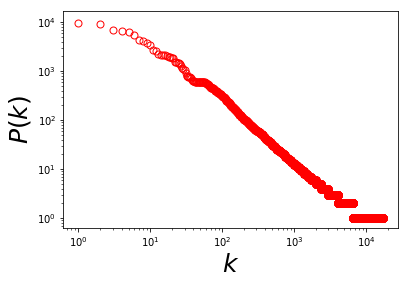

In [35]:
import matplotlib.pyplot as plt

plt.plot(range(len(freq_new_y)), freq_new_y, 'r',marker='o',markersize=7,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0)
plt.legend(loc='best')
plt.ylabel('$P(k)$',fontsize=25)
plt.xlabel('$k$',fontsize=25)
plt.yscale('log')
plt.xscale('log')
plt.rcParams.update({'font.size': 15})
plt.show()

## Grafo de palabras

In [36]:
import networkx as nx

def graph_weighted(text,K):
    #text=clean(text)
    unique_words=list(set(text))
    G=nx.Graph()
    for word in unique_words:
        G.add_node(word)
    for word in unique_words: ## recorremos el texto y encontramos los indices de todas las aparicions de word (index_word)
        index_word=[index for index, value in enumerate(text) if value == word]
        ## ahora buscamos las palabras vecinas en una ventana de largo K (hacia adelante)
        for index in index_word:
            for k in range(1,K+1):
                if index+k in range(len(text)):
                    if G.has_edge(text[index],text[index+k])==False:
                        G.add_edge(text[index],text[index+k],weight=1)
                    else:
                        x=G[text[index]][text[index+k]]['weight']
                        G[text[index]][text[index+k]]['weight']=x+1
    
    return G

G=graph_weighted(new_testament_words,4)

In [37]:
G.edges(data=True)

EdgeDataView([('llañkoniyiñ', 'feymew', {'weight': 1}), ('llañkoniyiñ', 'jesus', {'weight': 1}), ('llañkoniyiñ', 'witrapüray', {'weight': 1}), ('llañkoniyiñ', 'fey', {'weight': 1}), ('llañkoniyiñ', 'feypifingün', {'weight': 1}), ('llañkoniyiñ', 'petu', {'weight': 1}), ('llañkoniyiñ', 'kimeltufe', {'weight': 2}), ('kimeltungen', 'mew', {'weight': 2}), ('kimeltungen', 'ka', {'weight': 2}), ('kimeltungen', 'fentren', {'weight': 1}), ('kimeltungen', 'pepiluwün', {'weight': 1}), ('kimeltungen', 'fey', {'weight': 1}), ('kimeltungen', 'bernabe', {'weight': 1}), ('kimeltungen', 'engu', {'weight': 1}), ('kimeltungen', 'sawlu', {'weight': 1}), ('kimeltungen', 'ta', {'weight': 1}), ('kimeltungen', 'ñidol', {'weight': 1}), ('kimeltungen', 'jesus', {'weight': 1}), ('kimeltungen', 'püle', {'weight': 1}), ('kimeltungen', 'femngechi', {'weight': 1}), ('kimeltungen', 'rume', {'weight': 1}), ('kimeltungen', 'tañi', {'weight': 1}), ('kimeltungen', 'ñi', {'weight': 2}), ('kimeltungen', 'afmatuley', {'weig

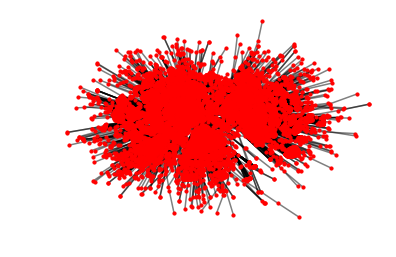

In [39]:
import matplotlib.pyplot as plt
import networkx as nx
T=nx.maximum_spanning_tree(G,weight='weight')
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, T.nodes, node_size = 10)
nx.draw_networkx_edges(T, pos, alpha=0.5,width=1.5)
plt.axis('off')
plt.show()

In [40]:
degree_sequence=sorted(dict(nx.degree(G,weight='weight')).values(),reverse=True)
degree_sequence

[86039,
 77240,
 72133,
 54656,
 51224,
 50368,
 43280,
 34408,
 32207,
 29824,
 26840,
 21244,
 20920,
 17992,
 17240,
 16712,
 16712,
 16096,
 15744,
 15504,
 15048,
 14734,
 12248,
 12040,
 11744,
 11712,
 11064,
 9920,
 9024,
 8712,
 8488,
 7232,
 6416,
 6288,
 6120,
 6040,
 5952,
 5816,
 5168,
 5048,
 4984,
 4976,
 4880,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4872,
 4712,
 4660,
 4648,
 4480,
 4448,
 4336,
 4312,
 4144,
 4112,
 3992,
 3848,
 3832,
 3776,
 3664,
 3616,
 3592,
 3568,
 3568,
 3544,
 3512,
 3448,
 3384,
 3344,
 3160,
 3152,
 3128,
 3096,
 3080,
 3048,
 2984,
 2960,
 2888,
 2848,
 2816,
 2808,
 2760,
 2752,
 2744,
 2680,
 2640,
 2600,
 2536,
 2488,
 2448,
 2432,
 2408,
 2406,
 2400,
 2392,
 2328,
 2320,
 2240,
 2216,
 2216,
 2200,
 2128,
 2088,
 2040,
 1992,
 1984,
 1984,
 1976,
 1912,
 1904,
 1888,
 1888,
 1872,
 1816,
 1808,
 1792,
 1784,
 1664,
 1656,
 1640,
 1616,
 1608,
 1592,
 1576,
 1544,
 1544,
 1504,
 1488,


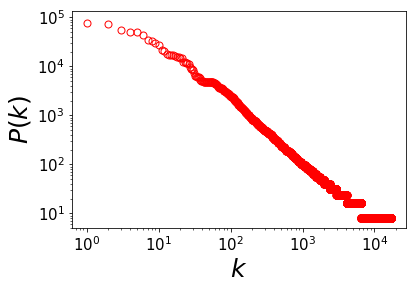

In [41]:
plt.plot(range(len(degree_sequence)), degree_sequence, 'r',marker='o',markersize=7,fillstyle='none',markeredgewidth=1,clip_on=False,linewidth=0)
plt.legend(loc='best')
plt.ylabel('$P(k)$',fontsize=25)
plt.xlabel('$k$',fontsize=25)
plt.yscale('log')
plt.xscale('log')
plt.rcParams.update({'font.size': 15})
plt.show()

In [42]:
import community
partition=community.best_partition(G)

In [43]:
len(list(set(partition.values())))

8

In [44]:
partition

{'llañkoniyiñ': 0,
 'kimeltungen': 0,
 'ngüyükilmün': 1,
 'widpünagümüñmafi': 2,
 'pifule': 0,
 'kelluafimün': 3,
 'dungufiel': 4,
 'pepikanien': 4,
 'kutrankawllefule': 4,
 'müngeltuniengeymi': 0,
 'tukulpanieael': 4,
 'deypüntukuwkiyawkey': 1,
 'werkütufi': 3,
 'duamtunielaiñ': 5,
 'wüldungulu': 0,
 'nütramyekeelchi': 4,
 'ninfa': 2,
 'chumngeafuy': 5,
 'truyuel': 0,
 'allfülkangeael': 3,
 'yeaeymünmew': 0,
 'chumaymün': 5,
 'püramyen': 1,
 'rangiñelwelen': 4,
 'adümlay': 5,
 'püramuwkelaiñ': 4,
 'manase': 3,
 'maneluwkülerkey': 1,
 'ramtulmeaetew': 3,
 'dapiafiel': 3,
 'wedwedkawkelu': 0,
 'wewpiael': 3,
 'adkülelu': 2,
 'püramelngey': 2,
 'elukefingün': 2,
 'dumiñelkafi': 2,
 'llangkünagi': 0,
 'ütrüfnagpamün': 0,
 'pipelaeyu': 2,
 'werküpefielchi': 5,
 'afnoael': 5,
 'kimeltuchen': 3,
 'longkontukun': 4,
 'miyawiyüm': 2,
 'fampuwülelfili': 5,
 'wünenkülen': 0,
 'ngenngelelu': 2,
 'firkülelaymi': 0,
 'ayüwiyiñ': 1,
 'mawünwelay': 0,
 'feypiwayiñ': 4,
 'tünay': 2,
 'nentukünuy': 0,


NameError: name 'partition' is not defined